<a href="https://colab.research.google.com/github/Saaj369/jpeg_compression/blob/main/JPEG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploring JPEG Compression

This notebook demonstrates the key steps involved in the JPEG compression process. We will explore:
- Color space conversion from RGB to YCbCr
- Chroma subsampling and downsampling
- The Discrete Cosine Transform (DCT)
- Quantization

At each step, we will visualize the intermediate results to provide a better understanding of how JPEG compression works.

# Image Analysis

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
img = Image.open("/content/drive/MyDrive/TestImages/flower.ppm")

array([[[34, 13,  8],
        [38, 16,  8],
        [37, 13,  8],
        ...,
        [61, 34, 10],
        [62, 35, 21],
        [65, 38, 15]],

       [[37, 14, 10],
        [42, 11,  8],
        [35, 12,  9],
        ...,
        [62, 37, 13],
        [57, 33, 16],
        [57, 31, 16]],

       [[39, 18,  8],
        [34, 14,  8],
        [38, 13,  9],
        ...,
        [58, 39, 20],
        [61, 36, 14],
        [68, 39, 18]],

       ...,

       [[61, 53, 43],
        [63, 49, 39],
        [66, 52, 37],
        ...,
        [79, 52, 25],
        [72, 51, 30],
        [74, 48, 23]],

       [[63, 51, 37],
        [63, 51, 46],
        [62, 55, 44],
        ...,
        [73, 47, 21],
        [78, 51, 25],
        [74, 51, 25]],

       [[67, 54, 44],
        [68, 54, 43],
        [66, 59, 50],
        ...,
        [73, 49, 22],
        [79, 53, 21],
        [79, 53, 26]]], dtype=uint8)
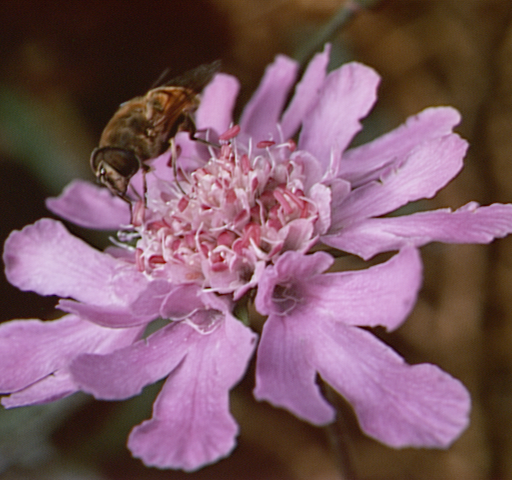

In [ ]:
img_array = np.array(img)
img_array

In [ ]:
pixels = img_array.reshape(-1, img_array.shape[-1])
R, G, B = pixels[:, 0], pixels[:, 1], pixels[:, 2]

This cell defines two helper functions: `plot_2d_hist` for plotting histograms of the color channels to visualize their intensity distributions, and `imshow_channels` for displaying individual image channels as grayscale images.

In [ ]:
def plot_2d_hist(V, bins = 200, color = ['r'], Xlabel = ["V"]):
  import matplotlib.pyplot as plt
  plt.style.use('dark_background')
  num_plots = len(V)
  if num_plots != len(color):
    color_= color*num_plots
  else:
    color_= color
  if num_plots != len(Xlabel):
    Xlabel_ = Xlabel*num_plots
  else:
    Xlabel_ = Xlabel
  fig, axs = plt.subplots(1, num_plots, figsize=(4*num_plots,4))
  for i in range(num_plots):
    axs[i].hist(V[i], bins = bins, color = color_[i])
    axs[i].set_title(Xlabel_[i])
    # axs[i].xlabel(Xlabel_[i])
    # axs[i].ylabel("Frequency")
  plt.show()

def imshow_channels(channels, titles):
  import matplotlib.pyplot as plt
  plt.style.use('dark_background')
  num_plots = len(channels)

  fig, axs = plt.subplots(1, num_plots, figsize=(4*num_plots, 4))
  for i in range(num_plots):
    axs[i].imshow(channels[i], cmap='gray', vmin=0, vmax=255)
    axs[i].set_title(titles[i])
    # fig.colorbar(im, ax=axs[i])
    # axs[i].colorbar()
  # plt.colorbar()
  plt.show()

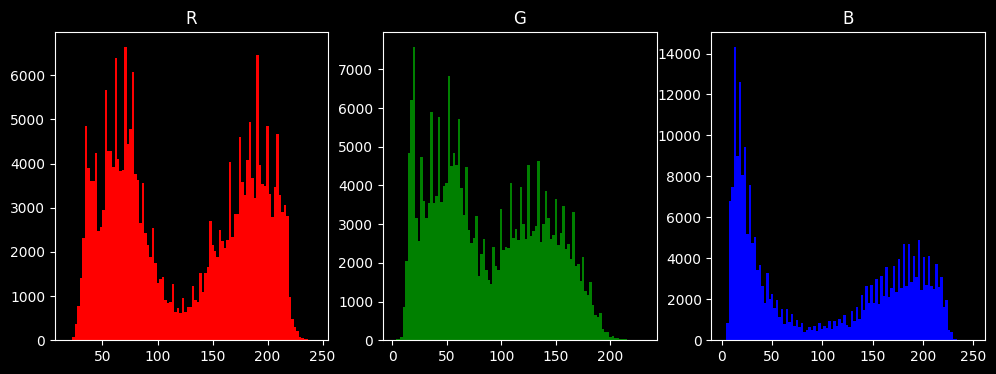

In [ ]:
plot_2d_hist([R,G,B], bins = 100, color = ['r', 'g', 'b'], Xlabel = ["R", "G", "B"])

In [ ]:
height, width, _ = img_array.shape

In [ ]:
R2d, G2d, B2d = img_array[:, :, 0], img_array[:, :, 1], img_array[:, :, 2]

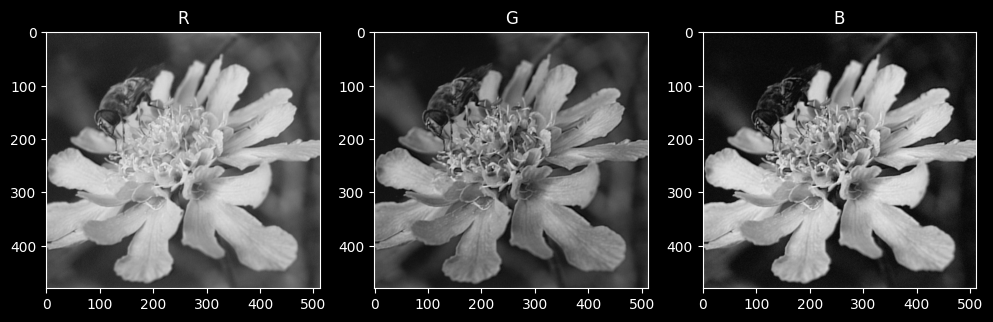

In [ ]:
imshow_channels([R2d, G2d, B2d], ["R", "G", "B"])

In [ ]:
def plot3Dinteractive(V2d, color = 'r'):
  import plotly.graph_objects as go
  import numpy as np
  # Normalize R values to [0, 1] for colorscale
  V_norm = (V2d - V2d.min()) / (V2d.max() - V2d.min())

  # Create custom red-only colorscale
  if color == 'r':
    color_scale = [[v, f'rgb({int(v*255)},0,0)'] for v in np.linspace(0, 1, 10)]
  elif color == 'g':
    color_scale = [[v, f'rgb(0,{int(v*255)},0)'] for v in np.linspace(0, 1, 10)]
  else:
    color_scale = [[v, f'rgb(0, 0,{int(v*255)})'] for v in np.linspace(0, 1, 10)]

  scene_camera = dict(eye=dict(x=0, y=0, z=2))  # top view along z-axis

  # fig = go.Figure(data=[go.Surface(z=V2d)])
  fig = go.Figure(data=[go.Surface(
      z=V2d,
      surfacecolor=V_norm,
      colorscale=color_scale,
      cmin=0,
      cmax=1
  )])

  # Update layout for black background
  fig.update_layout(
      title='3D Surface Plot from 2D NumPy Array',
      paper_bgcolor='black',         # Background outside the plot
      plot_bgcolor='black',          # Background inside the plot
      font=dict(color='white'),      # Make text visible on dark background
      scene=dict(
          camera = scene_camera,
          xaxis_title='X',
          yaxis_title='Y',
          zaxis_title='R Value',
          xaxis=dict(backgroundcolor='black', gridcolor='gray', zerolinecolor='gray'),
          yaxis=dict(backgroundcolor='black', gridcolor='gray', zerolinecolor='gray'),
          zaxis=dict(backgroundcolor='black', gridcolor='gray', zerolinecolor='gray'),
      )
  )

  fig.show()


In [ ]:
plot3Dinteractive(R2d, color = 'r')

In [ ]:
plot3Dinteractive(G2d, color = 'g')

In [ ]:
plot3Dinteractive(B2d, color = 'b')

# Pixel Format Conversion
<a href="https://en.wikipedia.org/wiki/YCbCr"><img src = "https://drive.google.com/uc?id=1k-EcpfdwAUfHwUsgs_vfvzRt2rAQg0Iu" height = "300px"></a>

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from numpy.typing import NDArray

In [ ]:
def rgbtoYCbCr(rgb:NDArray) -> NDArray:
  offset = np.array([0, 128, 128])
  transformationMatrix = np.array(
      [[0.299, 0.587, 0.114],
       [-0.168736, -0.331264, 0.5],
       [0.5, -0.418688, -0.081312]]
  )
  YCbCr = (transformationMatrix @ rgb) + offset
  return YCbCr

def YCbCrtorgb(YCbCr:NDArray) -> NDArray:
  offset = np.array([0, 128, 128])
  inversetransformationMatrix = np.array([
      [1, 0, 1.402],
      [1, -0.344136, -0.714136],
      [1, 1.772, 0]
  ])

  rgb = inversetransformationMatrix @ (YCbCr - offset)
  return rgb

transformationMatrix = np.array(
      [[0.299, 0.587, 0.114],
       [-0.168736, -0.331264, 0.5],
       [0.5, -0.418688, -0.081312]]
  )
offset = np.array([0, 128, 128])
inversetransformationMatrix = np.array([
      [1, 0, 1.402],
      [1, -0.344136, -0.714136],
      [1, 1.772, 0]
  ])

In [ ]:
print(rgbtoYCbCr(np.array([255, 255, 255])))
print(YCbCrtorgb(np.array([255, 128, 128])))

[255. 128. 128.]
[255. 255. 255.]


In [ ]:
ycbimg_array = img_array @ transformationMatrix.T + offset

In [ ]:
Y, Cb, Cr = ycbimg_array[:, :, 0], ycbimg_array[:, :, 1], ycbimg_array[:, :, 2]

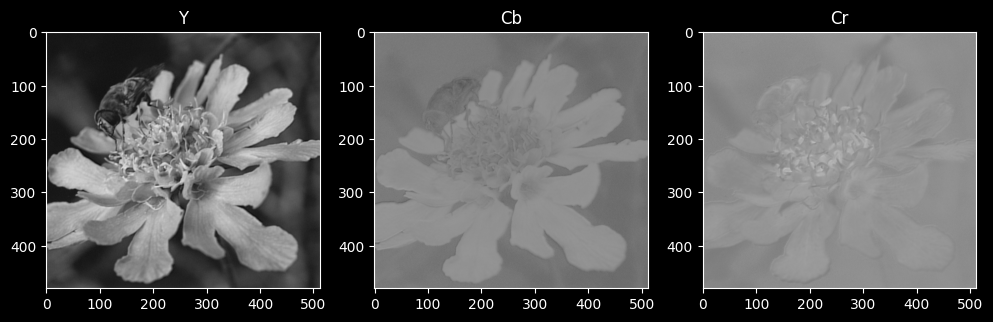

In [ ]:
imshow_channels([Y,Cb,Cr], ['Y', 'Cb', 'Cr'])

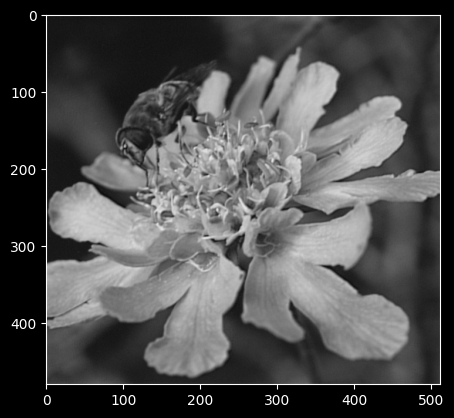

In [ ]:
grayrgb_array = ycbimg_array.copy()
grayrgb_array[:, :, 1] = grayrgb_array[:, :, 0]
grayrgb_array[:, :, 2] = grayrgb_array[:, :, 0]
plt.imshow(grayrgb_array.round().astype(np.uint8))
plt.show()

In [ ]:
rgbimg_array = (ycbimg_array - offset) @ inversetransformationMatrix.T

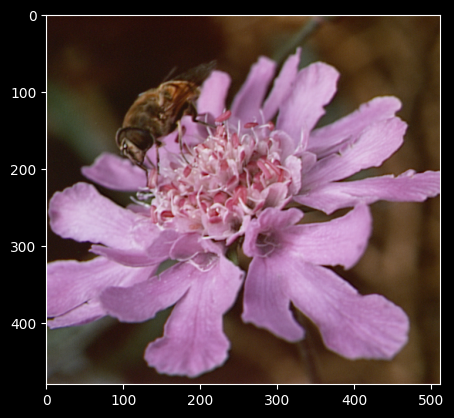

In [ ]:
plt.imshow(rgbimg_array.round().astype(np.uint8))
plt.show()

# Subsampling and Downsampling of Chroma

In [ ]:
w, h = Cb.shape

In [ ]:
def downsample_420(Ch:NDArray) -> NDArray:
  w,h = Ch.shape
  Ch_downsampled_420 = np.empty((w//2,h//2), dtype=np.float16)
  for row in range(0, w//2):
    for column in range(0, h//2):
      average = Ch[row*2:row*2+2, column*2:column*2+2].mean()
      Ch_downsampled_420[row, column] = average
  return Ch_downsampled_420

def subsample_420(Ch:NDArray) -> NDArray:
  w,h = Ch.shape
  Ch_subsampled_420 = np.empty((w//2,h//2), dtype=np.float16)
  for row in range(0, w//2):
    for column in range(0, h//2):
      leftmost_pixel = Ch[row*2, column*2]
      Ch_subsampled_420[row, column] = leftmost_pixel
  return Ch_subsampled_420

In [ ]:
Cb_subsampled_420 = subsample_420(Cb)
Cb_sub_round = Cb_subsampled_420.round().astype(np.uint8)

Cb_downsampled_420 = downsample_420(Cb)
Cb_down_round = Cb_downsampled_420.round().astype(np.uint8)

Cr_subsampled_420 = subsample_420(Cr)
Cr_sub_round = Cr_subsampled_420.round().astype(np.uint8)

Cr_downsampled_420 = downsample_420(Cr)
Cr_down_round = Cr_downsampled_420.round().astype(np.uint8)

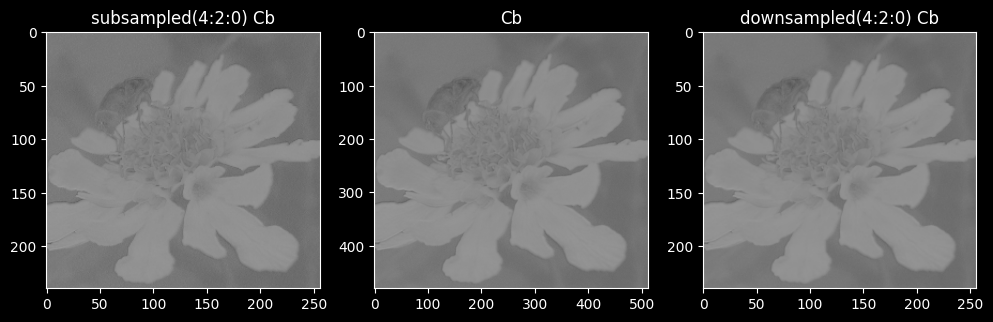

In [ ]:
imshow_channels([Cb_sub_round, Cb, Cb_down_round], ['subsampled(4:2:0) Cb','Cb', 'downsampled(4:2:0) Cb'])

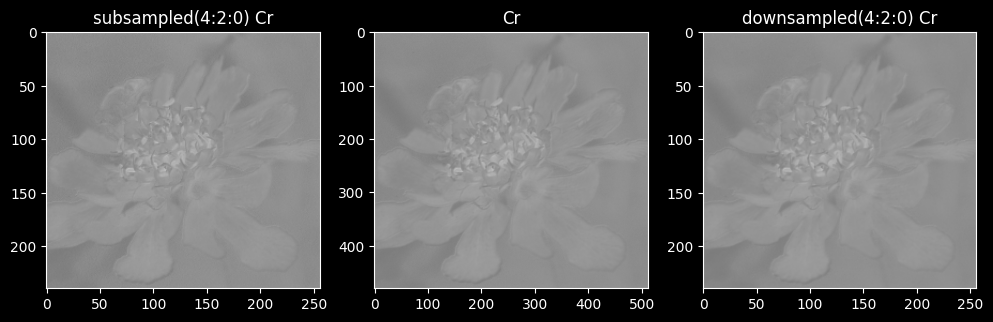

In [ ]:
imshow_channels([Cr_sub_round, Cr, Cr_down_round], ['subsampled(4:2:0) Cr','Cr', 'downsampled(4:2:0) Cr'])

# Resampling (Rescalling) of Chroma

In [ ]:
def rescale_420(sub_ch:NDArray) -> NDArray:
  w,h = sub_ch.shape
  Ch_rescale_420 = np.empty((w*2,h*2), dtype=np.uint8)
  for row in range(0, w):
    for column in range(0, h):
      Ch_rescale_420[row*2:row*2+2, column*2:column*2+2] = sub_ch[row, column]
  return Ch_rescale_420

In [ ]:
Cb_sub_rescale_420 = rescale_420(Cb_sub_round)

Cb_down_rescale_420 = rescale_420(Cb_down_round)

Cr_sub_rescale_420 = rescale_420(Cr_sub_round)

Cr_down_rescale_420 = rescale_420(Cr_down_round)

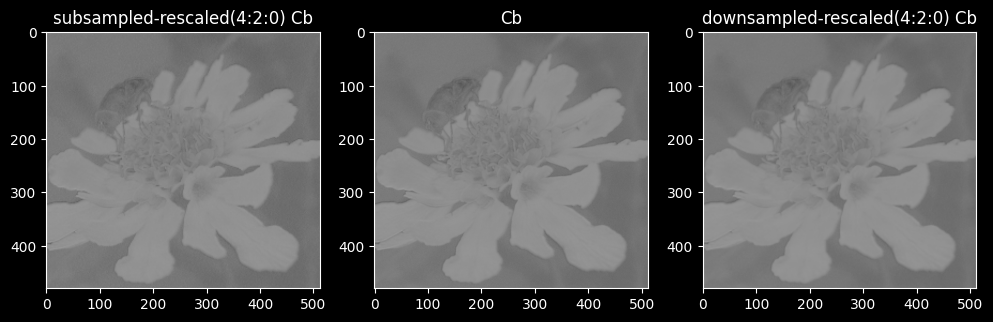

In [ ]:
imshow_channels([Cb_sub_rescale_420, Cb, Cb_down_rescale_420], ['subsampled-rescaled(4:2:0) Cb','Cb', 'downsampled-rescaled(4:2:0) Cb'])

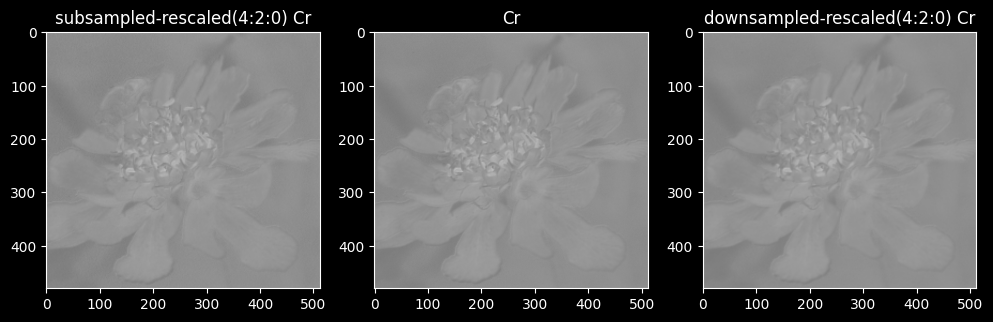

In [ ]:
imshow_channels([Cr_sub_rescale_420, Cr, Cr_down_rescale_420], ['subsampled-rescaled(4:2:0) Cr','Cr', 'downsampled-rescaled(4:2:0) Cr'])

# MCU and Descrete Cosine Transformation

In [ ]:
def DCT2d64freqs(u:int, v:int, res = 32) -> NDArray:
  ax = np.arange(0,res,1)
  cosax = np.cos((2*ax + 1)*u*np.pi/(2*res))
  cosay = np.cos((2*ax + 1)*v*np.pi/(2*res))
  cosx, cosy = np.meshgrid(cosax, cosay)

  Cosuv = (cosx*cosy)
  return Cosuv

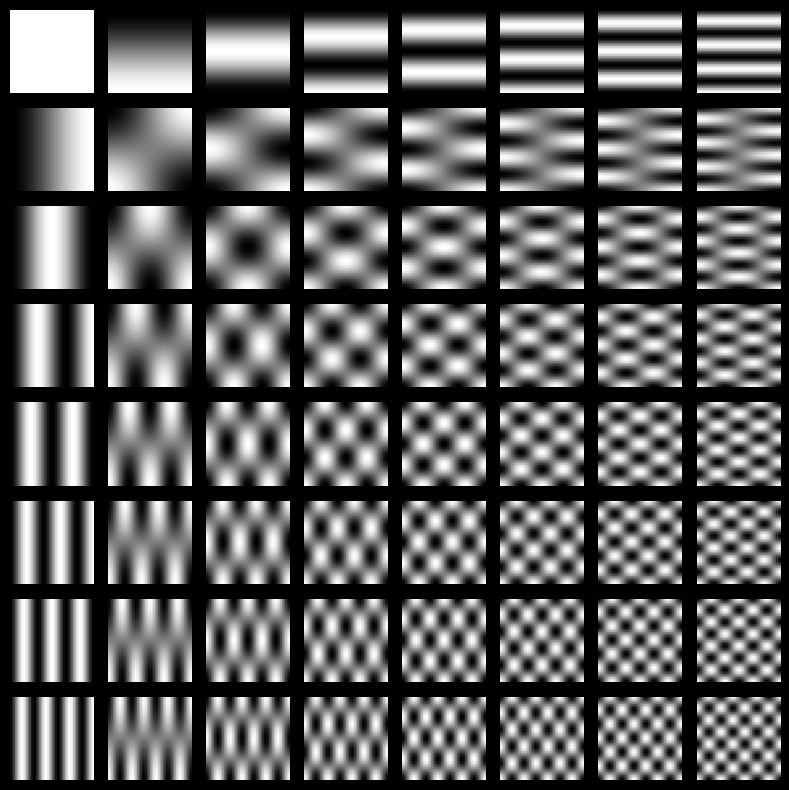

In [ ]:
def Visualise64freqs(res = 32, figSize = (8,8)):
  import matplotlib.pyplot as plt
  plt.style.use('dark_background')

  COLORuv_images = np.empty((8, 8, res, res), dtype=np.uint8)

  for i in range(8):
    for j in range(8):
      Coloruv = DCT2d64freqs(i, j, res = res)
      COLORuv_images[i, j] = ((Coloruv + 1)*255*0.5).round().astype(np.uint8)

  figs, axs = plt.subplots(8, 8, figsize=figSize)

  for i in range(8):
    for j in range(8):
      axs[i,j].imshow(COLORuv_images[i,j], cmap='gray_r')
      axs[i,j].axis('off') # Turn off axes for cleaner visualization

  plt.tight_layout() # Adjust layout to prevent overlap
  plt.show()

Visualise64freqs(32, (8,8))

In [ ]:
def DCT(u:int, v:int, mat8x8:NDArray) -> float:
  mat8x8 = mat8x8 - 128.0
  ax = np.arange(0,8,1)
  cosax = np.cos((2*ax + 1)*u*np.pi/16)
  cosay = np.cos((2*ax + 1)*v*np.pi/16)
  cosx, cosy = np.meshgrid(cosax, cosay)

  alpha = lambda x : 1/np.sqrt(2) if x == 0 else 1
  Guv = alpha(u)*alpha(v)*np.sum(mat8x8*cosx*cosy)/4
  return Guv

def inverseDCT(x:int, y:int, DCT_coeff:NDArray) -> float:

  au = np.arange(0,8,1)
  cosau = np.cos((2*x + 1)*au*np.pi/16)
  cosav = np.cos((2*y + 1)*au*np.pi/16)
  cosu, cosv = np.meshgrid(cosau, cosav)

  alpha = np.ones((8,8))
  alpha[0,:] *= np.sqrt(1/2)
  alpha[:,0] *= np.sqrt(1/2)

  pixxy = 128.0 + np.sum(alpha*DCT_coeff*cosu*cosv)/4

  return pixxy

In [ ]:
def ImgtoDCT(imgChannel:NDArray) -> NDArray:
  rows, cols = imgChannel.shape
  if rows%8 != 0 or cols%8 != 0:
    raise ValueError("Image dimensions must be a multiple of 8")
  else:
    imgDCT = np.empty((rows//8, cols//8, 8, 8), dtype = float)

    for x in range(rows//8):
      for y in range(cols//8):
        mat8x8 = imgChannel[8*x : 8*x + 8 , 8*y : 8*y + 8]
        for i in range(8):
          for j in range(8):
            imgDCT[x, y, i, j] = DCT(i, j, mat8x8)
    return imgDCT

def DCTtoImg(imgDCT:NDArray) -> NDArray:
  rows, cols, _, __ = imgDCT.shape
  imgChannel = np.empty((rows*8, cols*8), dtype = float)
  for x in range(rows):
    for y in range(cols):
      for i in range(8):
        for j in range(8):
          imgChannel[8*x + i, 8*y + j] = inverseDCT(i, j, imgDCT[x,y])
  return imgChannel


In [ ]:
DCTofY = ImgtoDCT(Y)
DCTofY.shape

(60, 64, 8, 8)

In [ ]:
DCTofCb = ImgtoDCT(Cb_sub_round)
DCTofCb.shape

(30, 32, 8, 8)

In [ ]:
DCTofCr = ImgtoDCT(Cr_sub_round)
DCTofCr.shape

(30, 32, 8, 8)

In [ ]:
invDCTofY = DCTtoImg(DCTofY)
invDCTofY.shape

(480, 512)

In [ ]:
invDCTofCb = DCTtoImg(DCTofCb)
invDCTofCb.shape

(240, 256)

In [ ]:
invDCTofCr = DCTtoImg(DCTofCr)
invDCTofCr.shape

(240, 256)

In [ ]:
rescaled_invDCTofCb = rescale_420(invDCTofCb)
rescaled_invDCTofCr = rescale_420(invDCTofCr)
rescaled_invDCTofCb.shape, rescaled_invDCTofCr.shape

((480, 512), (480, 512))

In [ ]:
compressed_YCB = np.dstack((Y, rescaled_invDCTofCb, rescaled_invDCTofCr))

In [ ]:
compressed_rgbimg = (compressed_YCB - offset) @ inversetransformationMatrix.T

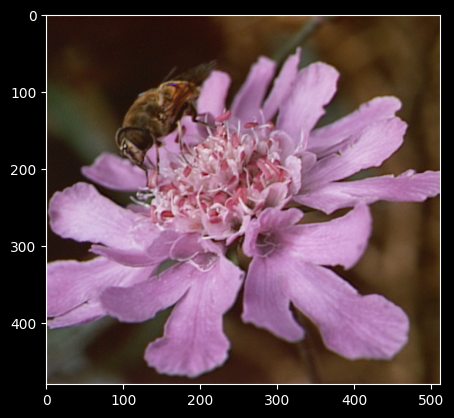

In [ ]:
plt.imshow(compressed_rgbimg.round().astype(np.uint8))
plt.show()

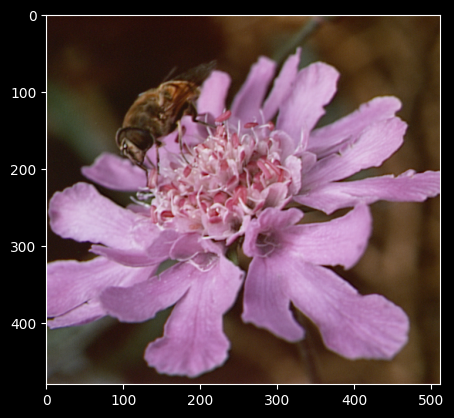

In [ ]:
plt.imshow(rgbimg_array.round().astype(np.uint8))
plt.show()

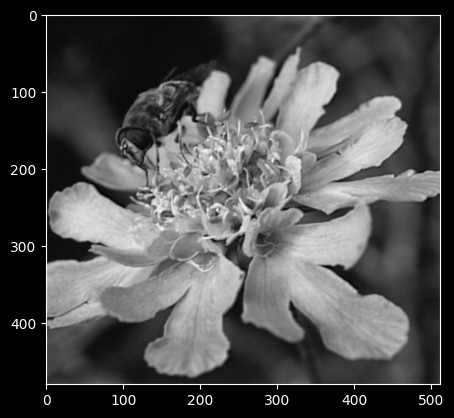

In [ ]:
plt.imshow(invDCTofY.round().astype(np.uint8), cmap='gray')
plt.show()

# Quantization (20%, 50%, 70%)

In [ ]:
# 20 %
Q20_L = np.array([
    [40,28,25,40,60,100,128,153],
    [30,30,35,48,66,147,153,140],
    [35,33,40,60,100,143,173,141],
    [35,43,55,73,128,218,201,157],
    [45,55,93,141,173,277,262,196],
    [60,87,140,163,205,263,286,233],
    [122,163,198,218,262,308,305,256],
    [180,233,241,249,286,255,262,252]
])

Q20_C = np.array([
    [43,46,60,117,247,247,247,247],
    [46,53,66,164,247,247,247,247],
    [60,66,140,247,247,247,247,247],
    [117,164,247,247,247,247,247,247],
    [247,247,247,247,247,247,247,247],
    [247,247,247,247,247,247,247,247],
    [247,247,247,247,247,247,247,247],
    [247,247,247,247,247,247,247,247]
])

# 50 %

Q50_L = np.array([
    [16,11,10,16,24,40,51,61],
    [12,12,14,19,26,58,60,55],
    [14,13,16,24,40,57,69,56],
    [14,17,22,29,51,87,80,62],
    [18,22,37,56,68,109,103,77],
    [24,35,55,64,81,104,113,92],
    [49,64,78,87,103,121,120,101],
    [72,92,95,98,112,100,103,99]
])

Q50_C = np.array([
    [17,18,24,47,99,99,99,99],
    [18,21,26,66,99,99,99,99],
    [24,26,56,99,99,99,99,99],
    [47,66,99,99,99,99,99,99],
    [99,99,99,99,99,99,99,99],
    [99,99,99,99,99,99,99,99],
    [99,99,99,99,99,99,99,99],
    [99,99,99,99,99,99,99,99]
])

# 70 %
Q70_L = np.array([
    [11, 8, 8,11,17,28,35,42],
    [ 9, 9,10,14,19,42,43,39],
    [10, 9,11,17,28,40,48,39],
    [10,12,15,20,35,59,55,43],
    [13,15,25,39,48,77,73,55],
    [17,25,39,45,57,73,79,64],
    [35,45,55,59,73,86,85,71],
    [51,64,66,69,79,71,73,70]
])

Q70_C = np.array([
    [12,13,17,33,69,69,69,69],
    [13,15,19,46,69,69,69,69],
    [17,19,39,69,69,69,69,69],
    [33,46,69,69,69,69,69,69],
    [69,69,69,69,69,69,69,69],
    [69,69,69,69,69,69,69,69],
    [69,69,69,69,69,69,69,69],
    [69,69,69,69,69,69,69,69]
])

In [ ]:
Quantized_DCTofY = (DCTofY / Q70_L).round().astype(int)
Quantized_DCTofCb = (DCTofCb / Q70_C).round().astype(int)
Quantized_DCTofCr = (DCTofCr / Q70_C).round().astype(int)

In [ ]:
imgQuantized_DCTofY = DCTtoImg(Quantized_DCTofY)
imgQuantized_DCTofCb = DCTtoImg(Quantized_DCTofCb)
imgQuantized_DCTofCr = DCTtoImg(Quantized_DCTofCr)

In [ ]:
rescaled_invDCTofCb = rescale_420(imgQuantized_DCTofCb)
rescaled_invDCTofCr = rescale_420(imgQuantized_DCTofCr)
rescaled_invDCTofCb.shape, rescaled_invDCTofCr.shape

((480, 512), (480, 512))

In [ ]:
compressed_YCB = np.dstack((imgQuantized_DCTofY, rescaled_invDCTofCb, rescaled_invDCTofCr))
compressed_rgbimg = (compressed_YCB - offset) @ inversetransformationMatrix.T

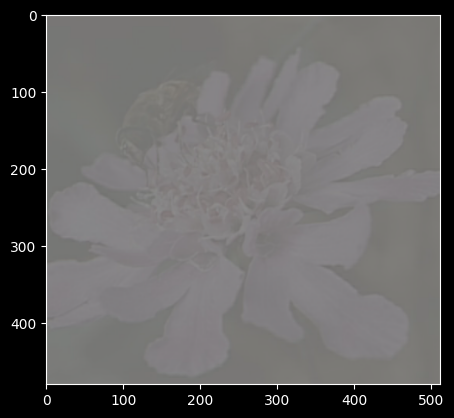

In [ ]:
plt.imshow(compressed_rgbimg.round().astype(np.uint8))
plt.show()

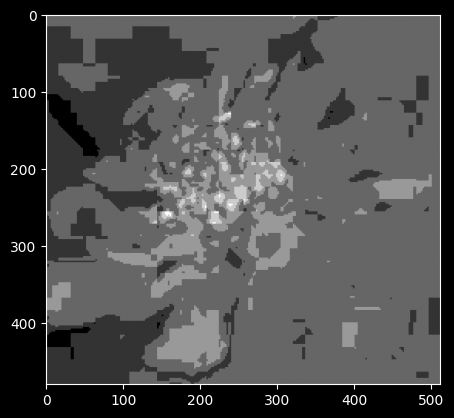

In [ ]:
plt.imshow(rescaled_invDCTofCr.round().astype(np.uint8), cmap='gray')
plt.show()

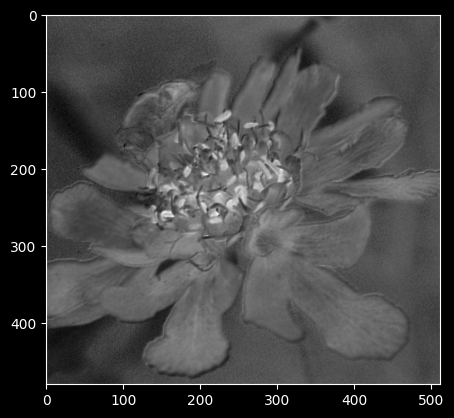

In [ ]:
plt.imshow(Cr, cmap='gray')
plt.show()